<div>
<img src=https://www.institutedata.com/wp-content/uploads/2019/10/iod_h_tp_primary_c.svg width="300">
</div>

# Capstone Project: Cyberbullying Classification 

## Abstract 

With rise of social media coupled with the Covid-19 pandemic, cyberbullying has reached all time highs. We can combat this by creating models to automatically flag potentially harmful tweets as well as break down the patterns of hatred.
- Original Data: [Cyberbullying](https://www.kaggle.com/andrewmvd/cyberbullying-classification)

## About this dataset


As social media usage becomes increasingly prevalent in every age group, a vast majority of citizens rely on this essential medium for day-to-day communication. Social media’s ubiquity means that cyberbullying can effectively impact anyone at any time or anywhere, and the relative anonymity
of the internet makes such personal attacks more difficult to stop than traditional bullying.

On April 15th, 2020, UNICEF issued a warning in response to the increased risk of cyberbullying during the COVID-19 pandemic due to widespread school closures, increased screen time, and decreased face-to-face social interaction. The statistics of cyberbullying are outright alarming: 36.5% of middle and high school students have felt cyberbullied and 87% have observed cyberbullying, with effects ranging from decreased academic performance to depression to suicidal thoughts.

In light of all of this, this dataset contains more than 47000 tweets labelled according to the class of cyberbullying:

- Age;
- Ethnicity;
- Gender;
- Religion;
- Other type of cyberbullying;
- Not cyberbullying

#### Find the best model to detect cyberbullying Tweets so to minimise/prevent bullying cases from happening

# Import libraries

In [161]:
## Import Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


import string
import regex as re
import spacy


import collections
from collections import Counter
import tensorflow as tf
import time


from sklearn.decomposition import LatentDirichletAllocation
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier,StackingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
from sklearn.linear_model import LogisticRegression, Lasso, RidgeClassifier
from sklearn.metrics import accuracy_score,precision_score, recall_score, roc_curve, classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.naive_bayes import MultinomialNB, GaussianNB
from sklearn.svm import LinearSVC
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline

# Graphs and charts 
!pip install plotly==5.5.0
import plotly.graph_objects as go
import plotly.express as px

from PIL import Image

# import warnings
# warnings.filterwarnings('ignore')

ModuleNotFoundError: No module named 'xgboost'

In [3]:
nlp = spacy.load("en_core_web_sm")

In [4]:
conda install -c conda-forge pyspellchecker

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.11.0
  latest version: 4.12.0

Please update conda by running

    $ conda update -n base -c defaults conda



# All requested packages already installed.


Note: you may need to restart the kernel to use updated packages.


In [5]:
from spellchecker import SpellChecker

In [6]:
!pip install nltk

In [7]:
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

In [8]:
nltk.download('words')
nltk.download('maxent_ne_chunker')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('omw-1.4')
nltk.download('wordnet')
nltk.download('stopwords')

[nltk_data] Downloading package words to /Users/anna_hj/nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     /Users/anna_hj/nltk_data...
[nltk_data]   Package maxent_ne_chunker is already up-to-date!
[nltk_data] Downloading package punkt to /Users/anna_hj/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/anna_hj/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package omw-1.4 to /Users/anna_hj/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/anna_hj/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/anna_hj/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [9]:
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from nltk import word_tokenize

In [10]:
!pip install unidecode

In [11]:
import unicodedata

In [12]:
conda install -c conda-forge emoji

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.11.0
  latest version: 4.12.0

Please update conda by running

    $ conda update -n base -c defaults conda



# All requested packages already installed.


Note: you may need to restart the kernel to use updated packages.


In [13]:
import emoji

In [14]:
print(emoji.emojize('Hi there! :revolving_hearts:'))

Hi there! 💞


In [15]:
conda install -c conda-forge wordcloud 

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.11.0
  latest version: 4.12.0

Please update conda by running

    $ conda update -n base -c defaults conda



# All requested packages already installed.


Note: you may need to restart the kernel to use updated packages.


In [16]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [17]:
conda install -c conda-forge textblob

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.11.0
  latest version: 4.12.0

Please update conda by running

    $ conda update -n base -c defaults conda



# All requested packages already installed.


Note: you may need to restart the kernel to use updated packages.


In [18]:
from textblob import TextBlob

In [19]:
conda install -c anaconda gensim

Solving environment: done

## Package Plan ##

  environment location: /Users/anna_hj/opt/anaconda3/envs/IOD-deep-learning

  added / updated specs:
    - gensim


The following packages will be UPDATED:

  certifi            conda-forge::certifi-2021.10.8-py39h6~ --> pkgs/main::certifi-2021.10.8-py39hecd8cb5_2
  openssl            conda-forge::openssl-1.1.1l-h0d85af4_0 --> pkgs/main::openssl-1.1.1m-hca72f7f_0

The following packages will be SUPERSEDED by a higher-priority channel:

  ca-certificates    conda-forge::ca-certificates-2021.10.~ --> anaconda::ca-certificates-2020.10.14-0


Preparing transaction: done
Verifying transaction: done
Executing transaction: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.11.0
  latest version: 4.12.0

Please update conda by running

    $ conda update -n base -c defaults conda



Note: you may need to restart the kernel to use updated packages.


In [20]:
import gensim
from gensim.models import Word2Vec

In [162]:
conda install -c conda-forge xgboost

Solving environment: done

## Package Plan ##

  environment location: /Users/anna_hj/opt/anaconda3/envs/IOD-deep-learning

  added / updated specs:
    - xgboost


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    _py-xgboost-mutex-2.0      |            cpu_0           8 KB  conda-forge
    libxgboost-1.5.1           |   cpu_h598c753_2         2.2 MB  conda-forge
    py-xgboost-1.5.1           |cpu_py39hb0a6171_2         152 KB  conda-forge
    xgboost-1.5.1              |cpu_py39h037b50c_2          12 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         2.4 MB

The following NEW packages will be INSTALLED:

  _py-xgboost-mutex  conda-forge/osx-64::_py-xgboost-mutex-2.0-cpu_0
  libxgboost         conda-forge/osx-64::libxgboost-1.5.1-cpu_h598c753_2
  py-xgboost         conda-forge/osx-64::py-xgboost-1.5.1

In [164]:
import xgboost
from xgboost import XGBClassifier

# Load the data

In [21]:
data = pd.read_csv("cyberbullying_tweets.csv")
data.head()

,tweet_text,cyberbullying_type
0,"In other words #katandandre, your food was cra...",not_cyberbullying
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying


In [22]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47692 entries, 0 to 47691
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   tweet_text          47692 non-null  object
 1   cyberbullying_type  47692 non-null  object
dtypes: object(2)
memory usage: 745.3+ KB


In [23]:
type(data)

pandas.core.frame.DataFrame

In [24]:
len(data)

47692

In [25]:
data.describe()

,tweet_text,cyberbullying_type
count,47692,47692
unique,46017,6
top,RT @sailorhg: the intro for my hardware hackin...,religion
freq,2,7998


No missing data, we will start doing EDA
- EDA before cleaning tweets
- EDA after cleaning Tweets

# EDA 
- cyberbullying_type

In [26]:
data.cyberbullying_type.unique()

array(['not_cyberbullying', 'gender', 'religion', 'other_cyberbullying',
       'age', 'ethnicity'], dtype=object)

In [27]:
#Replace education data for better understanding
data['cyberbullying_Yes_No']=data['cyberbullying_type'].str.replace('gender','cyberbullying')
data['cyberbullying_Yes_No']=data['cyberbullying_type'].str.replace('religion','cyberbullying')
data['cyberbullying_Yes_No']=data['cyberbullying_type'].str.replace('other_cyberbullying','cyberbullying')
data['cyberbullying_Yes_No']=data['cyberbullying_type'].str.replace('age','cyberbullying')
data['cyberbullying_Yes_No']=data['cyberbullying_type'].str.replace('ethnicity','cyberbullying')

In [28]:
data['cyberbullying_Yes_No']=data['cyberbullying_type'].apply(lambda x: 'cyberbullying' if x != 'not_cyberbullying' else x)

In [29]:
data.cyberbullying_type.unique()

array(['not_cyberbullying', 'gender', 'religion', 'other_cyberbullying',
       'age', 'ethnicity'], dtype=object)

In [30]:
data.cyberbullying_Yes_No.unique()

array(['not_cyberbullying', 'cyberbullying'], dtype=object)

In [31]:
data.head()

,tweet_text,cyberbullying_type,cyberbullying_Yes_No
0,"In other words #katandandre, your food was cra...",not_cyberbullying,not_cyberbullying
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,not_cyberbullying
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,not_cyberbullying
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,not_cyberbullying
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,not_cyberbullying


In [32]:
#Dataset is balanced for different categories 
fig = go.Figure(data=[go.Pie(labels=data['cyberbullying_type'].value_counts().index, values=data['cyberbullying_type'].value_counts().values)])
fig.update_layout(height=400, width=500, title_text="Pie chart showing cyberbullying_type")
fig.show()

Target variable consist 6 class which is: not_cyberbullying, gender, religion, other_cyberbullying, age, and ethnicity. We can see that our target variable seems to have balance composition (around 16% per class). So we dont need to do balancing.

In [33]:
data['cyberbullying_type'].value_counts()

religion               7998
age                    7992
gender                 7973
ethnicity              7961
not_cyberbullying      7945
other_cyberbullying    7823
Name: cyberbullying_type, dtype: int64

In [34]:
#The data is pretty well balanced
fig = go.Figure(data=[go.Pie(labels=data['cyberbullying_Yes_No'].value_counts().index, values=data['cyberbullying_Yes_No'].value_counts().values)])
fig.update_layout(height=400, width=500, title_text="Pie chart showing cyberbullying_Yes_No")
fig.show()

In [35]:
data['cyberbullying_Yes_No'].value_counts()

cyberbullying        39747
not_cyberbullying     7945
Name: cyberbullying_Yes_No, dtype: int64

# EDA
- tweet_text

In [36]:
data.sample(10)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No
21719,@DianH4 Another cheap Muslim lie. Give me proo...,religion,cyberbullying
27453,RT @MannyMua733: HOLY SHIT JSCXMANNY COMES OUT...,other_cyberbullying,cyberbullying
30591,My late sister and I used to be troublemakers ...,other_cyberbullying,cyberbullying
12246,RT @a_little_opus: @MaxDavidPaul @stekettle @G...,gender,cyberbullying
20964,Yes thats the problem ...u guys alwys love ur ...,religion,cyberbullying
12357,So when a man talks about molestation and rape...,gender,cyberbullying
26170,@Jackson13w @lukemckinney my last tweet to you...,other_cyberbullying,cyberbullying
26259,Watching drillbit taylor @PortableShua plays a...,other_cyberbullying,cyberbullying
18468,That’s very small minded. But then again you s...,religion,cyberbullying
36061,some of y’all must’ve been bullies in high sch...,age,cyberbullying


### EDA before cleaning the tweets

In [37]:
all_labels = data['cyberbullying_type'].unique()

In [38]:
def average_word_length(text):
    words = text.split()
    word_count = len(words)
    word_length = 0
    for word in words:
        word_length += len(word)
    avg_word_length = round(word_length / word_count,2)
    return avg_word_length


data['tweet_length'] = data['tweet_text'].apply(lambda x: len(x.split()))
data['average_word_length'] = data['tweet_text'].apply(average_word_length)

In [39]:
fig = px.box(data,
             x = 'cyberbullying_type',
             y = 'tweet_length',
             color = 'cyberbullying_type',
             color_discrete_sequence = px.colors.diverging.curl,
             title = 'Boxplot of Tweet Lengths per class'
)


fig.update_yaxes(range = [0,80])
fig.show()

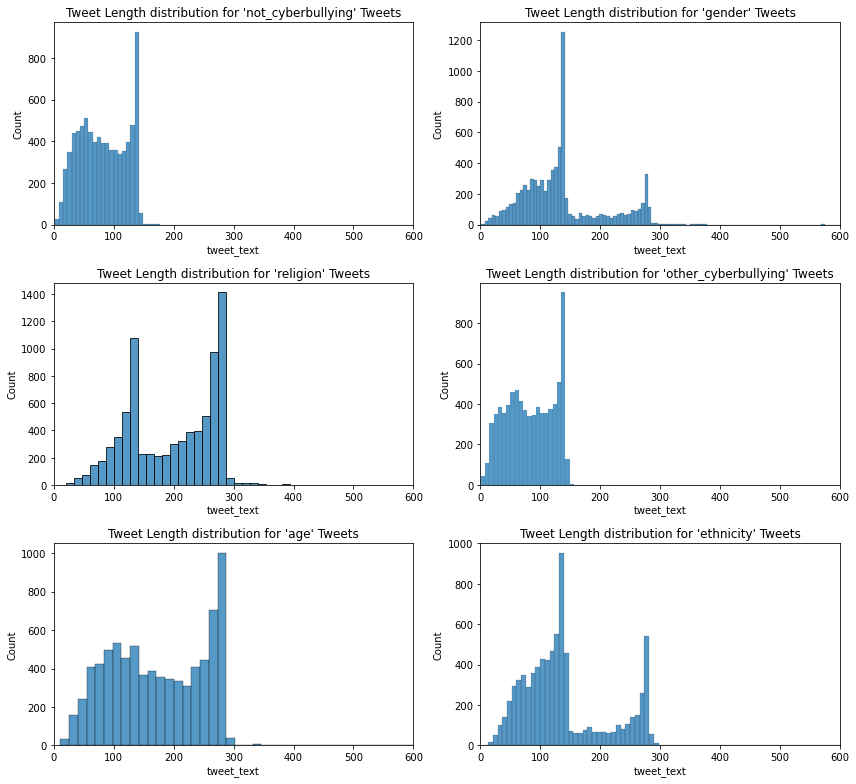

In [40]:
#Tweet Length before cleaning the tweets
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(12, 11))
k=0
for i in range(3):
    for j in range(2):
        cat = all_labels[k]
        tweet_len = data[data['cyberbullying_type']==cat]['tweet_text'].apply(lambda x:len(x) ) 
        sns.histplot(tweet_len, ax=ax[i,j]);
        ax[i,j].set_title("Tweet Length distribution for '{}' Tweets".format(cat));
        ax[i,j].set_xlim(0,600);
        #sns.histplot(tweet_1_len, ax=ax[1]);
        #ax[i,j].set_title("Tweet Length distribution for Disaster Tweets");
        plt.tight_layout();
        k+=1

In [41]:
# Viz: Word lengths per class
fig = px.box(data,
             x = 'cyberbullying_type',
             y = 'average_word_length',
             color = 'cyberbullying_type',
             color_discrete_sequence = px.colors.diverging.curl,
             title = 'Boxplot of Words Lengths per class'
)


fig.update_yaxes(range=[0,20])
fig.show()

In [42]:
def get_punct_count(text_lst):
    """Get Punctuation Counters for EDA"""
    punct_pattern = r"[!@#$%^&*()_\-=+}{\[\]|\\/<>,.?~`]?"
    all_puncts = list()
    for txt in text_lst:
        m_lst = re.findall(punct_pattern, txt)
        all_puncts.extend(m_lst)
    punct_counts = collections.Counter(all_puncts)
    return punct_counts

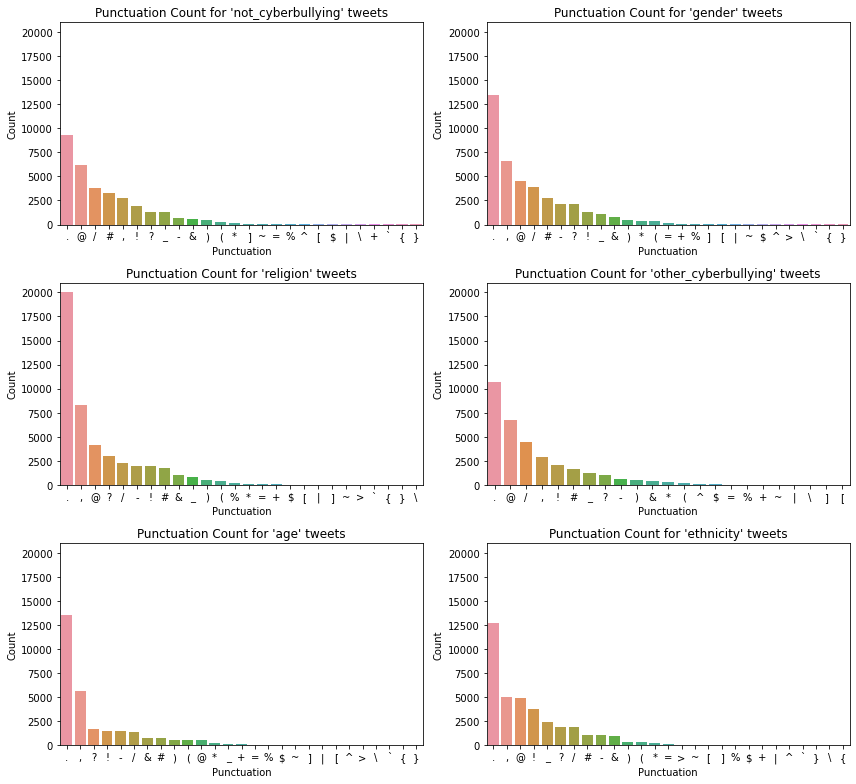

In [43]:
#Punctuation Count before cleaning the tweets
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(12, 11))
k=0
for i in range(3):
    for j in range(2):
        cat = all_labels[k]
        tweet_punct = get_punct_count(data[data['cyberbullying_type']==cat]['tweet_text'].tolist())
        tweet0_punct_cnt_sorted = tweet_punct.most_common()[1:]
        l0, h0, = [],[]
        _ = [(l0.append(i[0]), h0.append(i[1])) for i in tweet0_punct_cnt_sorted]

        sns.barplot(x=list(range(len(l0))), y=h0, ax=ax[i,j]);
        ax[i,j].set_ylim(top=21000);
        ax[i,j].set_xticks(ticks = list(range(len(l0))), labels=l0);
        ax[i,j].set_xlabel('Punctuation');
        ax[i,j].set_ylabel('Count');
        ax[i,j].set_title("Punctuation Count for '{}' tweets".format(cat));
        k+=1
fig.tight_layout();

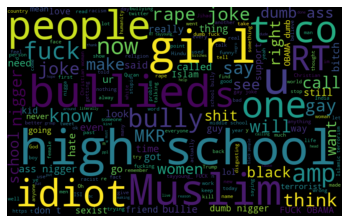

In [44]:
allwords = ' '.join([twts for twts in data['tweet_text']])
wordCloud = WordCloud(width=800,height=500,random_state=21,max_font_size=115).generate(allwords)

plt.imshow(wordCloud, interpolation="bilinear")
plt.axis('off')
plt.show()

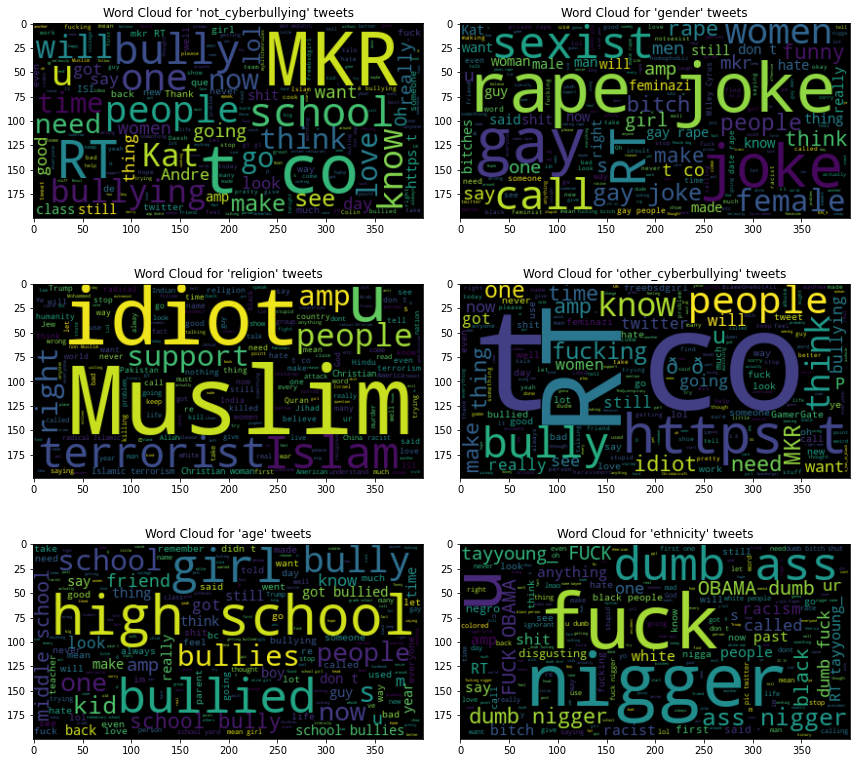

In [45]:
#Common Words appeared the most frequently before cleaning the Text
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(12, 11))
k=0
for i in range(3):
    for j in range(2):
        cat = all_labels[k]
        wordcloud = WordCloud().generate(" ".join(data[data['cyberbullying_type']==cat]['tweet_text'].tolist()))
        # Display the generated image:
        ax[i,j].imshow(wordcloud, interpolation='bilinear');
        ax[i,j].set_title("Word Cloud for '{}' tweets".format(cat));
        k+=1
fig.tight_layout();

In [46]:
#The overwhelming majority of tweets end at 62 tokens
fig = px.histogram(data,
                   x = 'tweet_length',
                   title = 'Distribution of Tweet Length',
                   color_discrete_sequence = ['#3ac2f9'],
                   opacity = 0.7,
                  )

fig.show()

#### Top 50 words for each cyberbullying type before cleaning the data

In [47]:
for cyber_type in data.cyberbullying_type.unique():
    
    top50_word = data.tweet_text[data.cyberbullying_type==cyber_type].str.split(expand=True).stack().value_counts()[:50]
    
    fig = px.bar(top50_word, color=top50_word.values, color_continuous_scale=px.colors.sequential.RdPu, custom_data=[top50_word.values])
    fig.update_traces(hovertemplate='<b>Count: </b>%{customdata[0]}')
    
    fig.update_layout(title=f"Top 50 words for {cyber_type}",
                     template='simple_white',
                     hovermode='x unified')
    fig.show()

### EDA after cleaning the tweets 

In [48]:
def clean_tags_mentions_single(txt):
    patt_mention = r"[@]\w+"
    patt_tags = r"[#]\w+"
    clean_str = re.sub(patt_mention, "", txt)
    clean_str = re.sub(patt_tags, "", clean_str)
    clean_str = re.sub(r'[0-9]+', '', clean_str)
    clean_str = re.sub("'ve", " have ", clean_str)
    clean_str = re.sub("&amp;", "", clean_str)
    clean_str = re.sub("\n", "", clean_str)
    return " ".join(clean_str.split())

In [49]:
data['cleaned_text'] = data['tweet_text'].apply(clean_tags_mentions_single)
data.head(5)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text
0,"In other words #katandandre, your food was cra...",not_cyberbullying,not_cyberbullying,9,5.89,"In other words , your food was crapilicious!"
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,not_cyberbullying,14,7.29,Why is so white?
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,not_cyberbullying,9,5.78,a classy whore? Or more red velvet cupcakes?
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,not_cyberbullying,18,4.72,"meh. :P thanks for the heads up, but not too c..."
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,not_cyberbullying,18,4.72,This is an ISIS account pretending to be a Kur...


In [ ]:
def lower(text):
    return text.lower()
data['cleaned_text2'] = data['cleaned_text'].apply(lower)
data['cleaned_text'] = data['cleaned_text2']
data.drop('cleaned_text2',axis='columns',inplace=True)
data.head(5)

In [50]:
def clean_text(tweet):
    #remove hashtags again
    pattern = re.compile(r"(#[A-Za-z0-9]+|@[A-Za-z0-9]+|https?://\S+|www\.\S+|\S+\.[a-z]+|RT @)")
    tweet = pattern.sub('', tweet)
    tweet = " ".join(tweet.split())
    tweet = re.sub(r"(https?:\/\/)(\s)*(www\.)?(\s)*((\w|\s)+\.)*([\w\-\s]+\/)*([\w\-]+)((\?)?[\w\s]*=\s*[\w\%&]*)*","",tweet) # remove URLs
    tweet = re.sub(r"#","",tweet) #removing the #symbol
    tweet = re.sub(r"RT[\s]+","",tweet) #removing RT
    tweet = re.sub(r"https?:\/\/S+","",tweet) #removing hyper link
    tweet = re.sub('[!:?.]', '', tweet)  # remove punctuations
    tweet = re.sub(r'[^\x00-\x7f]',r'', tweet) #remove non utf8/ascii characters such as '\x9a\x91\x97\x9a\x97'
    tweet = re.sub(r"can\'t", "can not", tweet)#remove contractions 'can not'
    tweet = re.sub(r"n\'t", " not", tweet)#remove contractions 'not'
    tweet = re.sub(r"\'re", " are", tweet)#remove contractions 'are'
    tweet = re.sub(r"\'s", " is", tweet)#remove contractions 'is'
    tweet = re.sub(r"\'d", " would", tweet)#remove contractions 'would'
    tweet = re.sub(r"\'ll", " will", tweet)#remove contractions 'will'
    tweet = re.sub(r"\'t", " not", tweet)#remove contractions 'not'
    tweet = re.sub(r"\'ve", " have", tweet)#remove contractions 'have'
    tweet = re.sub(r"\'m", " am", tweet)#remove contractions 'am'
    return tweet

In [51]:
data['cleaned_text2'] = data['cleaned_text'].apply(clean_text)
data['cleaned_text'] = data['cleaned_text2']
data.drop('cleaned_text2',axis='columns',inplace=True)
data.head(5)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text
0,"In other words #katandandre, your food was cra...",not_cyberbullying,not_cyberbullying,9,5.89,"In other words , your food was crapilicious"
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,not_cyberbullying,14,7.29,Why is so white
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,not_cyberbullying,9,5.78,a classy whore Or more red velvet cupcakes
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,not_cyberbullying,18,4.72,"meh P thanks for the heads up, but not too con..."
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,not_cyberbullying,18,4.72,This is an ISIS account pretending to be a Kur...


In [52]:
def remove_emojis_single(txt):
    return emoji.get_emoji_regexp().sub(u'', txt)

In [53]:
data['cleaned_text2'] = data['cleaned_text'].apply(clean_text)
data['cleaned_text'] = data['cleaned_text2']
data.drop('cleaned_text2',axis='columns',inplace=True)
data.head(5)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text
0,"In other words #katandandre, your food was cra...",not_cyberbullying,not_cyberbullying,9,5.89,"In other words , your food was crapilicious"
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,not_cyberbullying,14,7.29,Why is so white
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,not_cyberbullying,9,5.78,a classy whore Or more red velvet cupcakes
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,not_cyberbullying,18,4.72,"meh P thanks for the heads up, but not too con..."
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,not_cyberbullying,18,4.72,This is an ISIS account pretending to be a Kur...


In [54]:
def remove_emoji_again(txt):
    return re.sub(emoji.get_emoji_regexp(), r"", txt) #remove emoji

In [55]:
data['cleaned_text2'] = data['cleaned_text'].apply(clean_text)
data['cleaned_text'] = data['cleaned_text2']
data.drop('cleaned_text2',axis='columns',inplace=True)
data.head(5)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text
0,"In other words #katandandre, your food was cra...",not_cyberbullying,not_cyberbullying,9,5.89,"In other words , your food was crapilicious"
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,not_cyberbullying,14,7.29,Why is so white
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,not_cyberbullying,9,5.78,a classy whore Or more red velvet cupcakes
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,not_cyberbullying,18,4.72,"meh P thanks for the heads up, but not too con..."
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,not_cyberbullying,18,4.72,This is an ISIS account pretending to be a Kur...


In [56]:
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))
stop_words.update(['I','wa','p','like','o','e','rt', 'mkr', 'didn', 'bc', 'n', 'm', 'im', 'll', 'y', 've', 'u', 'ur', 'don', 't', 's','etc'])

In [57]:
data['cleaned_stopwords'] = data['cleaned_text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
data.head(10)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text,cleaned_stopwords
0,"In other words #katandandre, your food was cra...",not_cyberbullying,not_cyberbullying,9,5.89,"In other words , your food was crapilicious","In words , food crapilicious"
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,not_cyberbullying,14,7.29,Why is so white,Why white
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,not_cyberbullying,9,5.78,a classy whore Or more red velvet cupcakes,classy whore Or red velvet cupcakes
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,not_cyberbullying,18,4.72,"meh P thanks for the heads up, but not too con...","meh P thanks heads up, concerned another angry..."
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,not_cyberbullying,18,4.72,This is an ISIS account pretending to be a Kur...,This ISIS account pretending Kurdish account L...
5,"@Raja5aab @Quickieleaks Yes, the test of god i...",not_cyberbullying,not_cyberbullying,23,4.74,"Yes, the test of god is that good or bad or in...","Yes, test god good bad indifferent weird whate..."
6,Itu sekolah ya bukan tempat bully! Ga jauh kay...,not_cyberbullying,not_cyberbullying,10,4.50,Itu sekolah ya bukan tempat bully Ga jauh kaya...,Itu sekolah ya bukan tempat bully Ga jauh kaya...
7,Karma. I hope it bites Kat on the butt. She is...,not_cyberbullying,not_cyberbullying,14,3.57,Karma I hope it bites Kat on the butt She is j...,Karma hope bites Kat butt She nasty
8,@stockputout everything but mostly my priest,not_cyberbullying,not_cyberbullying,6,6.50,everything but mostly my priest,everything mostly priest
9,Rebecca Black Drops Out of School Due to Bully...,not_cyberbullying,not_cyberbullying,9,4.67,Rebecca Black Drops Out of School Due to Bullying,Rebecca Black Drops Out School Due Bullying


Stopwords are the words in any language which does not add much meaning to a sentence. They can safely be ignored without sacrificing the meaning of the sentence. For some search engines, these are some of the most common, short function words, such as the, is, at, which, and on.

In [58]:
stopword = stopwords.words('english')
def remove_stopwords(text):
    return " ".join([word for word in str(text).split() if word not in stopword])

In [59]:
data['cleaned_stopwords2'] = data['cleaned_stopwords'].apply(remove_stopwords)
data['cleaned_stopwords'] = data['cleaned_stopwords2']
data.drop('cleaned_stopwords2',axis='columns',inplace=True)
data.head(10)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text,cleaned_stopwords
0,"In other words #katandandre, your food was cra...",not_cyberbullying,not_cyberbullying,9,5.89,"In other words , your food was crapilicious","In words , food crapilicious"
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,not_cyberbullying,14,7.29,Why is so white,Why white
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,not_cyberbullying,9,5.78,a classy whore Or more red velvet cupcakes,classy whore Or red velvet cupcakes
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,not_cyberbullying,18,4.72,"meh P thanks for the heads up, but not too con...","meh P thanks heads up, concerned another angry..."
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,not_cyberbullying,18,4.72,This is an ISIS account pretending to be a Kur...,This ISIS account pretending Kurdish account L...
5,"@Raja5aab @Quickieleaks Yes, the test of god i...",not_cyberbullying,not_cyberbullying,23,4.74,"Yes, the test of god is that good or bad or in...","Yes, test god good bad indifferent weird whate..."
6,Itu sekolah ya bukan tempat bully! Ga jauh kay...,not_cyberbullying,not_cyberbullying,10,4.50,Itu sekolah ya bukan tempat bully Ga jauh kaya...,Itu sekolah ya bukan tempat bully Ga jauh kaya...
7,Karma. I hope it bites Kat on the butt. She is...,not_cyberbullying,not_cyberbullying,14,3.57,Karma I hope it bites Kat on the butt She is j...,Karma hope bites Kat butt She nasty
8,@stockputout everything but mostly my priest,not_cyberbullying,not_cyberbullying,6,6.50,everything but mostly my priest,everything mostly priest
9,Rebecca Black Drops Out of School Due to Bully...,not_cyberbullying,not_cyberbullying,9,4.67,Rebecca Black Drops Out of School Due to Bullying,Rebecca Black Drops Out School Due Bullying


In [60]:
lemmatizer = WordNetLemmatizer()
def lemmatize_word(text):
    return " ".join(lemmatizer.lemmatize(word) for word in str(text).split())

Lemmatization is the process of grouping together the different inflected forms of a word so they can be analyzed as a single item. Lemmatization is similar to stemming but it brings context to the words.

In [61]:
data['cleaned_stopwords2'] = data['cleaned_stopwords'].apply(lemmatize_word)
data['cleaned_stopwords'] = data['cleaned_stopwords2']
data.drop('cleaned_stopwords2',axis='columns',inplace=True)
data.head(20)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text,cleaned_stopwords
0,"In other words #katandandre, your food was cra...",not_cyberbullying,not_cyberbullying,9,5.89,"In other words , your food was crapilicious","In word , food crapilicious"
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,not_cyberbullying,14,7.29,Why is so white,Why white
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,not_cyberbullying,9,5.78,a classy whore Or more red velvet cupcakes,classy whore Or red velvet cupcake
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,not_cyberbullying,18,4.72,"meh P thanks for the heads up, but not too con...","meh P thanks head up, concerned another angry ..."
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,not_cyberbullying,18,4.72,This is an ISIS account pretending to be a Kur...,This ISIS account pretending Kurdish account L...
5,"@Raja5aab @Quickieleaks Yes, the test of god i...",not_cyberbullying,not_cyberbullying,23,4.74,"Yes, the test of god is that good or bad or in...","Yes, test god good bad indifferent weird whate..."
6,Itu sekolah ya bukan tempat bully! Ga jauh kay...,not_cyberbullying,not_cyberbullying,10,4.50,Itu sekolah ya bukan tempat bully Ga jauh kaya...,Itu sekolah ya bukan tempat bully Ga jauh kaya...
7,Karma. I hope it bites Kat on the butt. She is...,not_cyberbullying,not_cyberbullying,14,3.57,Karma I hope it bites Kat on the butt She is j...,Karma hope bite Kat butt She nasty
8,@stockputout everything but mostly my priest,not_cyberbullying,not_cyberbullying,6,6.50,everything but mostly my priest,everything mostly priest
9,Rebecca Black Drops Out of School Due to Bully...,not_cyberbullying,not_cyberbullying,9,4.67,Rebecca Black Drops Out of School Due to Bullying,Rebecca Black Drops Out School Due Bullying


#### Top 50 words for each cyberbullying type after cleaning the data

In [62]:
for cyber_type in data.cyberbullying_type.unique():
    
    top50_word = data.cleaned_stopwords[data.cyberbullying_type==cyber_type].str.split(expand=True).stack().value_counts()[:50]
    
    fig = px.bar(top50_word, color=top50_word.values, color_continuous_scale=px.colors.sequential.RdPu, custom_data=[top50_word.values])
    fig.update_traces(hovertemplate='<b>Count: </b>%{customdata[0]}')
    
    fig.update_layout(title=f"Top 50 words for {cyber_type}",
                     template='simple_white',
                     hovermode='x unified')
    
    fig.show()

#### Common words appear in the tweets after cleaning the text

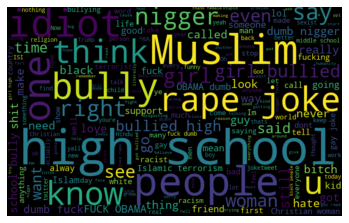

In [63]:
allwords = ' '.join([twts for twts in data['cleaned_stopwords']])
wordCloud = WordCloud(width=800,height=500,random_state=21,max_font_size=115).generate(allwords)

plt.imshow(wordCloud, interpolation="bilinear")
plt.axis('off')
plt.show()

#### Create a function to get the Subjectivity and Polarity
- Create a function to compute the negative, neutral and positive analysis

In [64]:
def getSubjectivity(text):
    return TextBlob(text).sentiment.subjectivity

def getPolarity(text):
    return TextBlob(text).sentiment.polarity

data['Subjectivity'] = data['cleaned_stopwords'].apply(getSubjectivity)
data['Polarity'] = data['cleaned_stopwords'].apply(getPolarity)

data.head()

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text,cleaned_stopwords,Subjectivity,Polarity
0,"In other words #katandandre, your food was cra...",not_cyberbullying,not_cyberbullying,9,5.89,"In other words , your food was crapilicious","In word , food crapilicious",0.00,0.00
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,not_cyberbullying,14,7.29,Why is so white,Why white,0.00,0.00
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,not_cyberbullying,9,5.78,a classy whore Or more red velvet cupcakes,classy whore Or red velvet cupcake,0.45,0.05
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,not_cyberbullying,18,4.72,"meh P thanks for the heads up, but not too con...","meh P thanks head up, concerned another angry ...",0.60,-0.15
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,not_cyberbullying,18,4.72,This is an ISIS account pretending to be a Kur...,This ISIS account pretending Kurdish account L...,0.00,0.00


In [65]:
def getAnalysis(score):
    if score < 0:
        return 'Negative'
    elif score == 0:
        return 'Neutral'
    else:
        return 'Positive'
    

data['Sentiment_Analysis'] = data['Polarity'].apply(getAnalysis)

data.head(5)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text,cleaned_stopwords,Subjectivity,Polarity,Sentiment_Analysis
0,"In other words #katandandre, your food was cra...",not_cyberbullying,not_cyberbullying,9,5.89,"In other words , your food was crapilicious","In word , food crapilicious",0.00,0.00,Neutral
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,not_cyberbullying,14,7.29,Why is so white,Why white,0.00,0.00,Neutral
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,not_cyberbullying,9,5.78,a classy whore Or more red velvet cupcakes,classy whore Or red velvet cupcake,0.45,0.05,Positive
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,not_cyberbullying,18,4.72,"meh P thanks for the heads up, but not too con...","meh P thanks head up, concerned another angry ...",0.60,-0.15,Negative
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,not_cyberbullying,18,4.72,This is an ISIS account pretending to be a Kur...,This ISIS account pretending Kurdish account L...,0.00,0.00,Neutral


# Encoding Features

In [66]:
data1 = data.copy()

In [67]:
data1['cyberbullying_type'] = data1['cyberbullying_type'].copy()
data1['cyberbullying_type'].replace(
    {'not_cyberbullying': 0,
             'gender': 1,
             'religion': 2,
             'age': 3,
             'ethnicity': 4,
     'other_cyberbullying': 5},
        inplace=True)
data1.head(3)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text,cleaned_stopwords,Subjectivity,Polarity,Sentiment_Analysis
0,"In other words #katandandre, your food was cra...",0,not_cyberbullying,9,5.89,"In other words , your food was crapilicious","In word , food crapilicious",0.00,0.00,Neutral
1,Why is #aussietv so white? #MKR #theblock #ImA...,0,not_cyberbullying,14,7.29,Why is so white,Why white,0.00,0.00,Neutral
2,@XochitlSuckkks a classy whore? Or more red ve...,0,not_cyberbullying,9,5.78,a classy whore Or more red velvet cupcakes,classy whore Or red velvet cupcake,0.45,0.05,Positive


In [68]:
data1.cleaned_stopwords[data1.cyberbullying_type == 5].head(3)

23916                             fyi, look caught botter,
23917    need switch organization-based github, want pa...
23918    RMAed monoprice Shoddy power brick Getting ref...
Name: cleaned_stopwords, dtype: object

In [69]:
#from sklearn.preprocessing import LabelEncoder
#data1 = data.copy()
#le = LabelEncoder()
#feature = ["cyberbullying_type"]

#for col in feature:
#    data1[col] = le.fit_transform(data[col])
#data1.sample(5)

In [70]:
data1.Sentiment_Analysis.unique()

array(['Neutral', 'Positive', 'Negative'], dtype=object)

In [71]:
data1['Sentiment_Analysis'] = data1['Sentiment_Analysis'].copy()
data1['Sentiment_Analysis'].replace(
    {'Neutral': 0,
             'Positive': 1,
             'Negative': 2},
        inplace=True)
data1.head(3)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text,cleaned_stopwords,Subjectivity,Polarity,Sentiment_Analysis
0,"In other words #katandandre, your food was cra...",0,not_cyberbullying,9,5.89,"In other words , your food was crapilicious","In word , food crapilicious",0.00,0.00,0
1,Why is #aussietv so white? #MKR #theblock #ImA...,0,not_cyberbullying,14,7.29,Why is so white,Why white,0.00,0.00,0
2,@XochitlSuckkks a classy whore? Or more red ve...,0,not_cyberbullying,9,5.78,a classy whore Or more red velvet cupcakes,classy whore Or red velvet cupcake,0.45,0.05,1


## Feature Engineering
__1. Text-Based__

- Char_Count = Number of Characters in Text
- Word Count = Number of Words in Text
- Word Density = Average Number of Char in Words
- Title Word Count = Number of Words in Title
- Uppercase Word Count = Number of Upperwords in Text

In [72]:
%%time
# ANSWER
data1['char_count']=data1['cleaned_stopwords'].apply(len)
data1['word_count']=data1['cleaned_stopwords'].apply(lambda x: len(x.split()))

CPU times: user 46.8 ms, sys: 1.61 ms, total: 48.4 ms
Wall time: 47.5 ms


In [73]:
data1['word_density']=data1['char_count']/(data1['word_count']+1)

In [74]:
data1['punctuation_count']=data1['cleaned_stopwords'].apply(lambda x: len(''.join(_ for _ in x if _ in string.punctuation)))

In [75]:
data1['title_word_count']=data1['cleaned_stopwords'].apply(lambda x: len([w for w in x.split() if w.istitle()]))

In [76]:
data1['uppercase_word_count']=data1['cleaned_stopwords'].apply(lambda x: len([w for w in x.split() if w.isupper()]))

In [77]:
# getting data of groupby
mean_txtcount = data1.groupby('cyberbullying_Yes_No')[['char_count','word_count','word_density']].mean()

# flattening data for plotting purposes
mean_txtcount = pd.DataFrame(mean_txtcount.stack())
mean_txtcount.reset_index(inplace=True)
mean_txtcount.rename(columns={
    0:'count','level_1':'type'},inplace=True)
mean_txtcount

,cyberbullying_Yes_No,type,count
0,cyberbullying,char_count,90.696983
1,cyberbullying,word_count,14.518253
2,cyberbullying,word_density,5.553433
3,not_cyberbullying,char_count,45.277030
4,not_cyberbullying,word_count,7.454374
5,not_cyberbullying,word_density,5.001132


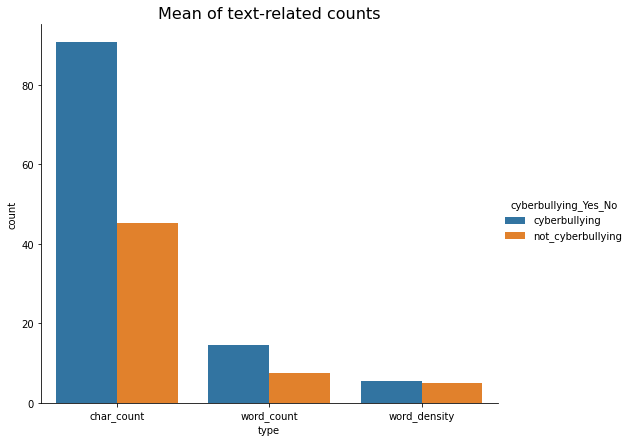

In [78]:
sns.catplot(x='type',y='count',data=mean_txtcount,hue='cyberbullying_Yes_No',kind='bar',\
            height=6,aspect=1.2)
plt.title('Mean of text-related counts',size=16);

In [79]:
# Initialise some columns for feature's counts
data1['adj_count'] = 0
data1['adv_count'] = 0
data1['noun_count'] = 0
data1['num_count'] = 0
data1['pron_count'] = 0
data1['propn_count'] = 0
data1['verb_count'] = 0

__2.Parts of Speech (POS)__

In [80]:
nlp = spacy.load('en_core_web_sm')

Part of Speech in **SpaCy**

    POS   DESCRIPTION               EXAMPLES
    ----- ------------------------- ---------------------------------------------
    ADJ   adjective                 big, old, green, incomprehensible, first
    ADP   adposition                in, to, during
    ADV   adverb                    very, tomorrow, down, where, there
    AUX   auxiliary                 is, has (done), will (do), should (do)
    CONJ  conjunction               and, or, but
    CCONJ coordinating conjunction  and, or, but
    DET   determiner                a, an, the
    INTJ  interjection              psst, ouch, bravo, hello
    NOUN  noun                      girl, cat, tree, air, beauty
    NUM   numeral                   1, 2017, one, seventy-seven, IV, MMXIV
    PART  particle                  's, not,
    PRON  pronoun                   I, you, he, she, myself, themselves, somebody
    PROPN proper noun               Mary, John, London, NATO, HBO
    PUNCT punctuation               ., (, ), ?
    SCONJ subordinating conjunction if, while, that
    SYM   symbol                    $, %, §, ©, +, −, ×, ÷, =, :), 😝
    VERB  verb                      run, runs, running, eat, ate, eating
    X     other                     sfpksdpsxmsa
    SPACE space

In [81]:
%%time
# ANSWER
for i in range(data1.shape[0]):
    doc = nlp(data1.iloc[i]['cleaned_stopwords'])
    c = Counter([t.pos_ for t in doc])
    data1.at[i, 'adj_count'] = c['ADJ']
    data1.at[i, 'adv_count'] = c['ADV']
    data1.at[i, 'noun_count'] = c['NOUN']
    data1.at[i, 'num_count'] = c['NUM']
    data1.at[i, 'pron_count'] = c['PRON']
    data1.at[i, 'propn_count'] = c['PROPN']
    data1.at[i, 'verb_count'] = c['VERB']

CPU times: user 3min 14s, sys: 817 ms, total: 3min 15s
Wall time: 3min 16s


In [82]:
cols = [
    'char_count', 'word_count', 'word_density',
    'punctuation_count', 'title_word_count', 
    'uppercase_word_count','adj_count',
    'adv_count', 'noun_count', 'num_count',
    'pron_count', 'propn_count', 'verb_count']

data1[cols].sample(5)

,char_count,word_count,word_density,punctuation_count,title_word_count,uppercase_word_count,adj_count,adv_count,noun_count,num_count,pron_count,propn_count,verb_count
10657,41,7,5.125000,1,1,1,2,0,3,0,0,0,1
27460,14,4,2.800000,0,0,0,1,0,1,0,1,0,1
36895,141,22,6.130435,0,2,2,3,1,8,0,1,2,6
11318,33,5,5.500000,2,3,0,0,0,1,0,0,2,1
30049,53,9,5.300000,1,1,0,0,0,4,0,0,0,2


In [83]:
# flattening data for plotting purposes
pos_count = data1.groupby('cyberbullying_Yes_No')[['adj_count','adv_count', 'pron_count','verb_count']].mean()
pos_count = pd.DataFrame(pos_count.stack())
pos_count.reset_index(inplace=True)
pos_count.rename(columns={
    0:'count','level_1':'type'},inplace=True)
pos_count

,cyberbullying_Yes_No,type,count
0,cyberbullying,adj_count,2.183762
1,cyberbullying,adv_count,0.783657
2,cyberbullying,pron_count,0.660352
3,cyberbullying,verb_count,2.873122
4,not_cyberbullying,adj_count,0.754311
5,not_cyberbullying,adv_count,0.412964
6,not_cyberbullying,pron_count,0.266079
7,not_cyberbullying,verb_count,1.423159


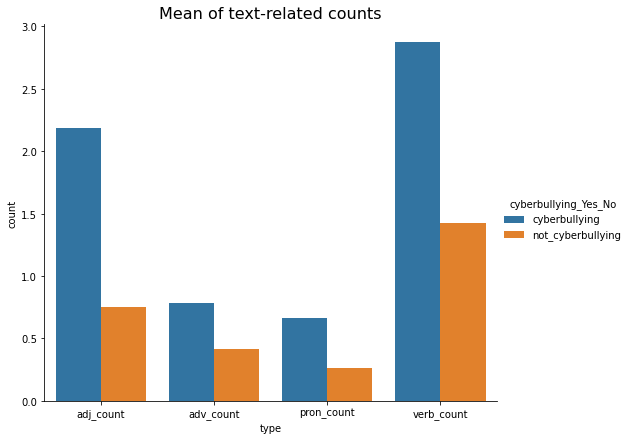

In [84]:
sns.catplot(x='type',y='count',data=pos_count,hue='cyberbullying_Yes_No',kind='bar',\
            height=6,aspect=1.2)
plt.title('Mean of text-related counts',size=16);

In [85]:
data1.sample(3)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text,cleaned_stopwords,Subjectivity,Polarity,Sentiment_Analysis,...,punctuation_count,title_word_count,uppercase_word_count,adj_count,adv_count,noun_count,num_count,pron_count,propn_count,verb_count
10213,@RepTedYoho Why did you call a female colleagu...,1,cyberbullying,24,4.62,Why did you call a female colleague a bitch Yo...,Why call female colleague bitch You resign imm...,0.354167,-0.145833,2,...,0,2,0,1,2,2,0,1,0,5
31346,RT @PrincessBravato: I truly am disgusted this...,5,cyberbullying,16,7.56,I truly am disgusted this corrupt heartless ba...,truly disgusted corrupt heartless bastard frea...,1.000000,-0.750000,2,...,0,1,0,3,1,1,0,0,1,1
42580,"LMAO ""@Dfapatterson: #confusingthingsgirlsdo ....",4,cyberbullying,19,6.42,"LMAO "" dah fuck twitter like it ai not hard en...","LMAO "" dah fuck twitter ai hard enough keep ni...",0.656944,-0.111111,2,...,2,0,1,3,1,2,0,0,3,3


In [86]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47692 entries, 0 to 47691
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   tweet_text            47692 non-null  object 
 1   cyberbullying_type    47692 non-null  int64  
 2   cyberbullying_Yes_No  47692 non-null  object 
 3   tweet_length          47692 non-null  int64  
 4   average_word_length   47692 non-null  float64
 5   cleaned_text          47692 non-null  object 
 6   cleaned_stopwords     47692 non-null  object 
 7   Subjectivity          47692 non-null  float64
 8   Polarity              47692 non-null  float64
 9   Sentiment_Analysis    47692 non-null  int64  
 10  char_count            47692 non-null  int64  
 11  word_count            47692 non-null  int64  
 12  word_density          47692 non-null  float64
 13  punctuation_count     47692 non-null  int64  
 14  title_word_count      47692 non-null  int64  
 15  uppercase_word_coun

## Split the data into train and test

In [87]:
# Features and Labels
X = data1['cleaned_stopwords']#Predictor Variable (47k,19)
y = data1['cyberbullying_type'] # Target Variable
print("X shape: {} \ny shape: {}".format(X.shape, y.shape))
X

X shape: (47692,) 
y shape: (47692,)


0                              In word , food crapilicious
1                                                Why white
2                       classy whore Or red velvet cupcake
3        meh P thanks head up, concerned another angry ...
4        This ISIS account pretending Kurdish account L...
                               ...                        
47687    Black ppl expected anything, depended anything...
47688    Turner withhold disappointment Turner called c...
47689    swear God This dumb nigger bitch got bleach ha...
47690    Yea fuck IF YOURE A NIGGER FUCKING UNFOLLOW ME...
47691    Bro U gotta chill Dog FUCK KP dumb nigger bitc...
Name: cleaned_stopwords, Length: 47692, dtype: object

In [88]:
# split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)
print("X_train shape: {} y_train shape: {}".format(X_train.shape, y_train.shape))
print("X_test shape : {} y_test shape: {}".format(X_test.shape, y_test.shape))


X_train shape: (38153,) y_train shape: (38153,)
X_test shape : (9539,) y_test shape: (9539,)


## Count Vectors as features

In [89]:
# create a count vectorizer object
count_vect = CountVectorizer(token_pattern = r'\w{1,}')

# Learn a vocabulary dictionary of all tokens in the raw documents
count_vect.fit(data1['cleaned_stopwords'])

# Transform documents to document-term matrix.
X_train_countv = count_vect.transform(X_train)
X_test_countv = count_vect.transform(X_test)

## TF-IDF Vectors as features
- Word level
- N-Gram level
- Character level

In [90]:
%%time
# word level tf-idf
tfidf_vect = TfidfVectorizer(analyzer = 'word',
                             token_pattern = r'\w{1,}',
                             max_features = 5000)
print(tfidf_vect)

tfidf_vect.fit(data['cleaned_stopwords'])
X_train_tfidf = tfidf_vect.transform(X_train)
X_test_tfidf  = tfidf_vect.transform(X_test)

TfidfVectorizer(max_features=5000, token_pattern='\\w{1,}')
CPU times: user 899 ms, sys: 21 ms, total: 920 ms
Wall time: 924 ms


In [91]:
%%time
# ngram level tf-idf
tfidf_vect_ngram = TfidfVectorizer(analyzer = 'word',
                                   token_pattern = r'\w{1,}',
                                   ngram_range = (2, 3),
                                   max_features = 5000)
print(tfidf_vect_ngram)

tfidf_vect_ngram.fit(data1['cleaned_stopwords'])
X_train_tfidf_ngram = tfidf_vect_ngram.transform(X_train)
X_test_tfidf_ngram  = tfidf_vect_ngram.transform(X_test)

TfidfVectorizer(max_features=5000, ngram_range=(2, 3), token_pattern='\\w{1,}')
CPU times: user 3.43 s, sys: 134 ms, total: 3.56 s
Wall time: 3.61 s


In [92]:
%%time
# characters level tf-idf
tfidf_vect_ngram_chars = TfidfVectorizer(analyzer = 'char',
                                         token_pattern = r'\w{1,}',
                                         ngram_range = (2, 3),
                                         max_features = 5000)
print(tfidf_vect_ngram_chars)

tfidf_vect_ngram_chars.fit(data1['cleaned_stopwords'])
X_train_tfidf_ngram_chars = tfidf_vect_ngram_chars.transform(X_train)
X_test_tfidf_ngram_chars  = tfidf_vect_ngram_chars.transform(X_test)

TfidfVectorizer(analyzer='char', max_features=5000, ngram_range=(2, 3),
                token_pattern='\\w{1,}')


/Users/anna_hj/opt/anaconda3/envs/IOD-deep-learning/lib/python3.9/site-packages/sklearn/feature_extraction/text.py:546: UserWarning:

The parameter 'token_pattern' will not be used since 'analyzer' != 'word'



CPU times: user 6.61 s, sys: 153 ms, total: 6.76 s
Wall time: 6.79 s


## Topic Models

In [93]:
lda_model = LatentDirichletAllocation(n_components = 30, learning_method = 'online', max_iter = 50)

def show_topic_word(data1):
    X_topics = lda_model.fit_transform(data1)
    topic_word = lda_model.components_ 
    vocab = count_vect.get_feature_names_out()
    n_top_words = 10
    topic_summaries = []
    print('Group Top Words')
    print('-----', '-'*80)
    for i, topic_dist in enumerate(topic_word):
        topic_words = np.array(vocab)[np.argsort(topic_dist)][:-(n_top_words+1):-1]
        top_words = ' '.join(topic_words)
        topic_summaries.append(top_words)
        print('  %3d %s' % (i, top_words))

In [94]:
%%time
show_topic_word(X_train_countv)

Group Top Words
----- --------------------------------------------------------------------------------
    0 back could fight tonight more terrible room cyber tbh guys
    1 going anyone care lt might happy baby wait literally x
    2 woman right christian want well getting anti when far police
    3 one see love first that feel way made show would
    4 isis quran the us your reason ass allah fear send
    5 mean middle name used game her poor tried able eye
    6 said day even thing whole class left i help though
    7 bully school really kid my high ugly went hell go
    8 black but people anything still past person year tell she
    9 they two last up ago dick full example happen out
   10 dont white people terrorism called so know get man never
   11 would always bad boy twitter ppl yeah actually yall little
   12 get he guy hate nothing in wrong done sorry story
   13 jokes cant ok this get hope thats kind race male
   14 fuck dumb nigger as bitch obama you shit fucking black
   

# Modelling

In [110]:
## helper function
def train_model(classifier, X_train_data, y_train_data, X_test_data):
    # fit the training dataset on the classifier
    classifier.fit(X_train_data, y_train_data)

    # predict the labels on validation dataset
    predictions = classifier.predict(X_test_data)

    return accuracy_score(predictions, y_test),recall_score(predictions, y_test, average='macro'), \
precision_score(predictions, y_test,  average='macro')

In [103]:
# Keep the results in a dataframe
results = pd.DataFrame(columns = ['Classification Model',
                                  'Scoring',
                                  'Count Vectors',
                                  'WordLevel TF-IDF',
                                  'N-Gram Vectors',
                                  'CharLevel Vectors'])

- Multinomial Naive Bayes Classifier
- Bagging: Random Forest
- Gradient boosting 
- xgboost
- stacking 

### Multinomial Naive Bayes Classifier

In [120]:
%%time
# Naive Bayes on Count Vectors
accuracy_mnb_cv, recall_mnb_cv, precision_mnb_cv = train_model(MultinomialNB(), X_train_countv, y_train, X_test_countv)
print('MultinomialNB, Count Vectors, Accuracy  : %.3f\n' % accuracy_mnb_cv)
print('MultinomialNB, Count Vectors, Recall  : %.3f\n' % recall_mnb_cv)
print('MultinomialNB, Count Vectors, Precision  : %.3f\n' % precision_mnb_cv)

MultinomialNB, Count Vectors, Accuracy  : 0.737

MultinomialNB, Count Vectors, Recall  : 0.739

MultinomialNB, Count Vectors, Precision  : 0.721

CPU times: user 36.2 ms, sys: 7.5 ms, total: 43.7 ms
Wall time: 40.8 ms


In [116]:
%%time
# Naive Bayes on td-idf (Word_level)
accuracy_mnb_tfidf, recall_mnb_tfidf, precision_mnb_tfidf = train_model(MultinomialNB(),X_train_tfidf, y_train, X_test_tfidf)
print('MultinomialNB, TD-IDF_word, Accuracy  : %.3f\n' % accuracy_mnb_tfidf)
print('MultinomialNB, TD-IDF_word, Recall  : %.3f\n' % recall_mnb_tfidf)
print('MultinomialNB, TD-IDF_word, Precision  : %.3f\n' % precision_mnb_tfidf)

MultinomialNB, TD-IDF_word, Accuracy  : 0.745

MultinomialNB, TD-IDF_word, Recall  : 0.747

MultinomialNB, TD-IDF_word, Precision  : 0.730

CPU times: user 21.1 ms, sys: 12.6 ms, total: 33.6 ms
Wall time: 40.1 ms


In [117]:
%%time
# Naive Bayes on td-idf (N_gram level)
accuracy_mnb_ngram, recall_mnb_ngram, precision_mnb_ngram = train_model(MultinomialNB(),X_train_tfidf_ngram, y_train, X_test_tfidf_ngram)
print('MultinomialNB, TD-IDF_ngram, Accuracy  : %.3f\n' % accuracy_mnb_ngram)
print('MultinomialNB, TD-IDF_ngram, Recall  : %.3f\n' % recall_mnb_ngram)
print('MultinomialNB, TD-IDF_ngram, Precision  : %.3f\n' % precision_mnb_ngram)

MultinomialNB, TD-IDF_ngram, Accuracy  : 0.610

MultinomialNB, TD-IDF_ngram, Recall  : 0.614

MultinomialNB, TD-IDF_ngram, Precision  : 0.643

CPU times: user 19.6 ms, sys: 10.2 ms, total: 29.9 ms
Wall time: 31.7 ms


In [118]:
%%time
# # Naive Bayes on Character Level TF IDF Vectors
accuracy_mnb_ngram_chars, recall_mnb_ngram_chars, precision_mnb_ngram_chars = train_model(MultinomialNB(), X_train_tfidf_ngram_chars, y_train, X_test_tfidf_ngram_chars)
print('MultinomialNB, TD-IDF_ngram_chars, Accuracy  : %.3f\n' % accuracy_mnb_ngram_chars)
print('MultinomialNB, TD-IDF_ngram_chars, Recall  : %.3f\n' % recall_mnb_ngram_chars)
print('MultinomialNB, TD-IDF_ngram_chars, Precision  : %.3f\n' % precision_mnb_ngram_chars)

MultinomialNB, TD-IDF_ngram_chars, Accuracy  : 0.722

MultinomialNB, TD-IDF_ngram_chars, Recall  : 0.724

MultinomialNB, TD-IDF_ngram_chars, Precision  : 0.715

CPU times: user 47 ms, sys: 37 ms, total: 84.1 ms
Wall time: 82.2 ms


In [125]:
# Scoring: accuracy 
results = results.append({
    'Classification Model': 'MultinomialNB',
    'Scoring': 'Accuracy',
    'Count Vectors': accuracy_mnb_cv,
    'WordLevel TF-IDF': accuracy_mnb_tfidf,
    'N-Gram Vectors': accuracy_mnb_ngram,
    'CharLevel Vectors': accuracy_mnb_ngram_chars},ignore_index=True)

In [126]:
# Scoring: Recall 
results = results.append({
    'Classification Model': 'MultinomialNB',
    'Scoring': 'Recall',
    'Count Vectors': recall_mnb_cv,
    'WordLevel TF-IDF': recall_mnb_tfidf,
    'N-Gram Vectors': recall_mnb_ngram,
    'CharLevel Vectors': recall_mnb_ngram_chars},ignore_index=True)

,Classification Model,Scoring,Count Vectors,WordLevel TF-IDF,N-Gram Vectors,CharLevel Vectors,CharLevel TF-IDF
0,MultinomialNB,Accuracy,0.736660,0.745256,0.610441,NaN,0.721564
1,MultinomialNB,Accuracy,0.736660,0.745256,0.610441,0.721564,NaN
2,MultinomialNB,Accuracy,0.736660,0.745256,0.610441,0.721564,NaN
3,MultinomialNB,Accuracy,0.736660,0.745256,0.610441,0.721564,NaN
4,MultinomialNB,Accuracy,0.736660,0.745256,0.610441,0.721564,NaN
5,MultinomialNB,Recall,0.739208,0.747424,0.614299,0.723679,NaN


In [130]:
# Scoring: Precision
results = results.append({
    'Classification Model': 'MultinomialNB',
    'Scoring': 'Precision',
    'Count Vectors': precision_mnb_cv,
    'WordLevel TF-IDF': precision_mnb_tfidf,
    'N-Gram Vectors': precision_mnb_ngram,
    'CharLevel Vectors': precision_mnb_ngram_chars},ignore_index=True)

In [134]:
results

,Classification Model,Scoring,Count Vectors,WordLevel TF-IDF,N-Gram Vectors,CharLevel Vectors,CharLevel TF-IDF
0,MultinomialNB,Accuracy,0.736660,0.745256,0.610441,NaN,0.721564
1,MultinomialNB,Accuracy,0.736660,0.745256,0.610441,0.721564,NaN
2,MultinomialNB,Accuracy,0.736660,0.745256,0.610441,0.721564,NaN
3,MultinomialNB,Accuracy,0.736660,0.745256,0.610441,0.721564,NaN
4,MultinomialNB,Accuracy,0.736660,0.745256,0.610441,0.721564,NaN
5,MultinomialNB,Recall,0.739208,0.747424,0.614299,0.723679,NaN
6,MultinomialNB,Recall,0.720545,0.729718,0.642708,0.714882,NaN
7,MultinomialNB,Recall,0.720545,0.729718,0.642708,0.714882,NaN
8,MultinomialNB,Precision,0.720545,0.729718,0.642708,0.714882,NaN
9,MultinomialNB,Precision,0.720545,0.729718,0.642708,0.714882,NaN


### Bagging: Random Forest

In [142]:
gs_rf = GridSearchCV(RandomForestClassifier(),param_grid={
    'max_depth':[220,250],
    'n_estimators':[80,120]               
},scoring='f1_macro')

In [143]:
%%time
gs_rf.fit(X_train_countv,y_train)
gs_rf.best_estimator_

CPU times: user 29min 45s, sys: 7.96 s, total: 29min 53s
Wall time: 30min 3s


RandomForestClassifier(max_depth=250, n_estimators=120)

In [144]:
%%time
# Bagging (Random Forest) on Count Vectors
accuracy_rf_cv, recall_rf_cv, precision_rf_cv = train_model(gs_rf.best_estimator_, X_train_countv, y_train, X_test_countv)
print('RamdomForest, Count Vectors, Accuracy  : %.3f\n' % accuracy_rf_cv)
print('RamdomForest, Count Vectors, Recall  : %.3f\n' % recall_rf_cv)
print('RamdomForest, Count Vectors, Precision  : %.3f\n' % precision_rf_cv)

RamdomForest, Count Vectors, Accuracy  : 0.802

RamdomForest, Count Vectors, Recall  : 0.803

RamdomForest, Count Vectors, Precision  : 0.812

CPU times: user 2min 36s, sys: 713 ms, total: 2min 37s
Wall time: 2min 38s


In [145]:
%%time
# Bagging (Random Forest) on Word Level TF IDF Vectors
accuracy_rf_tfidf, recall_rf_tfidf, precision_rf_tfidf= train_model(gs_rf.best_estimator_, X_train_tfidf, y_train, X_test_tfidf)
print('RamdomForest, TD-IDF_word, Accuracy  : %.3f\n' % accuracy_rf_tfidf)
print('RamdomForest, TD-IDF_word, Recall  : %.3f\n' % recall_rf_tfidf)
print('RamdomForest, TD-IDF_word, Precision  : %.3f\n' % precision_rf_tfidf)

RamdomForest, TD-IDF_word, Accuracy  : 0.803

RamdomForest, TD-IDF_word, Recall  : 0.805

RamdomForest, TD-IDF_word, Precision  : 0.811

CPU times: user 48.6 s, sys: 257 ms, total: 48.9 s
Wall time: 49.2 s


In [146]:
%%time
# Bagging (Random Forest) on Ngram Level TF IDF Vectors
accuracy_rf_ngram, recall_rf_ngram, precision_rf_ngram = train_model(gs_rf.best_estimator_, X_train_tfidf_ngram, y_train, X_test_tfidf_ngram)
print('RamdomForest, TD-IDF_ngram, Accuracy  : %.3f\n' % accuracy_rf_ngram)
print('RamdomForest, TD-IDF_ngram, Recall  : %.3f\n' % recall_rf_ngram)
print('RamdomForest, TD-IDF_ngram, Precision  : %.3f\n' % precision_rf_ngram)

RamdomForest, TD-IDF_ngram, Accuracy  : 0.643

RamdomForest, TD-IDF_ngram, Recall  : 0.643

RamdomForest, TD-IDF_ngram, Precision  : 0.798

CPU times: user 11.6 s, sys: 98.6 ms, total: 11.7 s
Wall time: 11.9 s


In [147]:
%%time
# Bagging (Random Forest) on Character Level TF IDF Vectors
accuracy_rf_ngram_chars, recall_rf_ngram_chars, precision_rf_ngram_chars = train_model(gs_rf.best_estimator_, X_train_tfidf_ngram_chars, y_train, X_test_tfidf_ngram_chars)
print('RamdomForest, TD-IDF_ngram_chars, Accuracy  : %.3f\n' % accuracy_rf_ngram_chars)
print('RamdomForest, TD-IDF_ngram_chars, Recall  : %.3f\n' % recall_rf_ngram_chars)
print('RamdomForest, TD-IDF_ngram_chars, Precision  : %.3f\n' % precision_rf_ngram_chars)

RamdomForest, TD-IDF_ngram_chars, Accuracy  : 0.795

RamdomForest, TD-IDF_ngram_chars, Recall  : 0.796

RamdomForest, TD-IDF_ngram_chars, Precision  : 0.807

CPU times: user 3min 32s, sys: 707 ms, total: 3min 33s
Wall time: 3min 34s


In [148]:
# Scoring: accuracy 
results = results.append({
    'Classification Model': 'RamdomForest',
    'Scoring': 'Accuracy',
    'Count Vectors': accuracy_rf_cv,
    'WordLevel TF-IDF': accuracy_rf_tfidf,
    'N-Gram Vectors': accuracy_rf_ngram,
    'CharLevel Vectors': accuracy_rf_ngram_chars},ignore_index=True)
# Scoring: Recall 
results = results.append({
    'Classification Model': 'RamdomForest',
    'Scoring': 'Recall',
    'Count Vectors': recall_rf_cv,
    'WordLevel TF-IDF': recall_rf_tfidf,
    'N-Gram Vectors': recall_rf_ngram,
    'CharLevel Vectors': recall_rf_ngram_chars},ignore_index=True)
# Scoring: Precision
results = results.append({
    'Classification Model': 'RamdomForest',
    'Scoring': 'Precision',
    'Count Vectors': precision_rf_cv,
    'WordLevel TF-IDF': precision_rf_tfidf,
    'N-Gram Vectors': precision_rf_ngram,
    'CharLevel Vectors': precision_rf_ngram_chars},ignore_index=True)

### Boosting: Gradient Boosting

In [149]:
%%time
# Naive Bayes on Count Vectors
accuracy_gb_cv, recall_gb_cv, precision_gb_cv = train_model(GradientBoostingClassifier(n_estimators=150), X_train_countv, y_train, X_test_countv)
print('Gradient_Boost, Count Vectors, Accuracy  : %.3f\n' % accuracy_gb_cv)
print('Gradient_Boost, Count Vectors, Recall  : %.3f\n' % recall_gb_cv)
print('Gradient_Boost, Count Vectors, Precision  : %.3f\n' % precision_gb_cv)

Gradient_Boost, Count Vectors, Accuracy  : 0.811

Gradient_Boost, Count Vectors, Recall  : 0.812

Gradient_Boost, Count Vectors, Precision  : 0.839

CPU times: user 8min 49s, sys: 784 ms, total: 8min 50s
Wall time: 8min 50s


In [150]:
%%time
# Bagging (Random Forest) on Word Level TF IDF Vectors
accuracy_gb_tfidf, recall_gb_tfidf, precision_gb_tfidf= train_model(GradientBoostingClassifier(n_estimators=150), X_train_tfidf, y_train, X_test_tfidf)
print('Gradient_Boost, TD-IDF_word, Accuracy  : %.3f\n' % accuracy_gb_tfidf)
print('Gradient_Boost, TD-IDF_word, Recall  : %.3f\n' % recall_gb_tfidf)
print('Gradient_Boost, TD-IDF_word, Precision  : %.3f\n' % precision_gb_tfidf)

Gradient_Boost, TD-IDF_word, Accuracy  : 0.811

Gradient_Boost, TD-IDF_word, Recall  : 0.813

Gradient_Boost, TD-IDF_word, Precision  : 0.838

CPU times: user 1min 27s, sys: 142 ms, total: 1min 27s
Wall time: 1min 27s


In [151]:
%%time
# Naive Bayes on td-idf (N_gram level)
accuracy_gb_ngram, recall_gb_ngram, precision_gb_ngram = train_model(GradientBoostingClassifier(n_estimators=150),X_train_tfidf_ngram, y_train, X_test_tfidf_ngram)
print('Gradient_Boost, TD-IDF_ngram, Accuracy  : %.3f\n' % accuracy_gb_ngram)
print('Gradient_Boost, TD-IDF_ngram, Recall  : %.3f\n' % recall_gb_ngram)
print('Gradient_Boost, TD-IDF_ngram, Precision  : %.3f\n' % precision_gb_ngram)

Gradient_Boost, TD-IDF_ngram, Accuracy  : 0.628

Gradient_Boost, TD-IDF_ngram, Recall  : 0.628

Gradient_Boost, TD-IDF_ngram, Precision  : 0.821

CPU times: user 23.3 s, sys: 39.5 ms, total: 23.3 s
Wall time: 23.3 s


In [152]:
%%time
# # Naive Bayes on Character Level TF IDF Vectors
accuracy_gb_ngram_chars, recall_gb_ngram_chars, precision_gb_ngram_chars = train_model(GradientBoostingClassifier(n_estimators=150), X_train_tfidf_ngram_chars, y_train, X_test_tfidf_ngram_chars)
print('Gradient_Boost, TD-IDF_ngram_chars, Accuracy  : %.3f\n' % accuracy_gb_ngram_chars)
print('Gradient_Boost, TD-IDF_ngram_chars, Recall  : %.3f\n' % recall_gb_ngram_chars)
print('Gradient_Boost, TD-IDF_ngram_chars, Precision  : %.3f\n' % precision_gb_ngram_chars)

Gradient_Boost, TD-IDF_ngram_chars, Accuracy  : 0.813

Gradient_Boost, TD-IDF_ngram_chars, Recall  : 0.814



NameError: name 'precision_gbb_ngram_chars' is not defined

In [153]:
# Scoring: accuracy 
results = results.append({
    'Classification Model': 'Gradient_Boost',
    'Scoring': 'Accuracy',
    'Count Vectors': accuracy_gb_cv,
    'WordLevel TF-IDF': accuracy_gb_tfidf,
    'N-Gram Vectors': accuracy_gb_ngram,
    'CharLevel Vectors': accuracy_gb_ngram_chars},ignore_index=True)
# Scoring: Recall 
results = results.append({
    'Classification Model': 'Gradient_Boost',
    'Scoring': 'Recall',
    'Count Vectors': recall_gb_cv,
    'WordLevel TF-IDF': recall_gb_tfidf,
    'N-Gram Vectors': recall_gb_ngram,
    'CharLevel Vectors': recall_gb_ngram_chars},ignore_index=True)
# Scoring: Precision
results = results.append({
    'Classification Model': 'Gradient_Boost',
    'Scoring': 'Precision',
    'Count Vectors': precision_gb_cv,
    'WordLevel TF-IDF': precision_gb_tfidf,
    'N-Gram Vectors': precision_gb_ngram,
    'CharLevel Vectors': precision_gb_ngram_chars},ignore_index=True)
results

,Classification Model,Scoring,Count Vectors,WordLevel TF-IDF,N-Gram Vectors,CharLevel Vectors,CharLevel TF-IDF
0,MultinomialNB,Accuracy,0.736660,0.745256,0.610441,NaN,0.721564
1,MultinomialNB,Accuracy,0.736660,0.745256,0.610441,0.721564,NaN
2,MultinomialNB,Accuracy,0.736660,0.745256,0.610441,0.721564,NaN
3,MultinomialNB,Accuracy,0.736660,0.745256,0.610441,0.721564,NaN
4,MultinomialNB,Accuracy,0.736660,0.745256,0.610441,0.721564,NaN
5,MultinomialNB,Recall,0.739208,0.747424,0.614299,0.723679,NaN
6,MultinomialNB,Recall,0.720545,0.729718,0.642708,0.714882,NaN
7,MultinomialNB,Recall,0.720545,0.729718,0.642708,0.714882,NaN
8,MultinomialNB,Precision,0.720545,0.729718,0.642708,0.714882,NaN
9,MultinomialNB,Precision,0.720545,0.729718,0.642708,0.714882,NaN


### XGBoost

In [167]:
xgb = XGBClassifier(n_estimators=300,max_depth=6,eta=0.1)

In [168]:
%%time
# Naive Bayes on Count Vectors
accuracy_xgb_cv, recall_xgb_cv, precision_xgb_cv = train_model(xgb, X_train_countv, y_train, X_test_countv)
print('XGBoost, Count Vectors, Accuracy  : %.3f\n' % accuracy_xgb_cv)
print('XGBoost, Count Vectors, Recall  : %.3f\n' % recall_xgb_cv)
print('XGBoost, Count Vectors, Precision  : %.3f\n' % precision_xgb_cv)

/Users/anna_hj/opt/anaconda3/envs/IOD-deep-learning/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[18:57:23] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1645117948562/work/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
XGBoost, Count Vectors, Accuracy  : 0.820

XGBoost, Count Vectors, Recall  : 0.822

XGBoost, Count Vectors, Precision  : 0.837

CPU times: user 2min 52s, sys: 5.98 s, total: 2min 58s
Wall time: 23.9 s


In [169]:
%%time
# Bagging (Random Forest) on Word Level TF IDF Vectors
accuracy_xgb_tfidf, recall_xgb_tfidf, precision_xgb_tfidf= train_model(xgb, X_train_tfidf, y_train, X_test_tfidf)
print('XGBoost, TD-IDF_word, Accuracy  : %.3f\n' % accuracy_xgb_tfidf)
print('XGBoost, TD-IDF_word, Recall  : %.3f\n' % recall_xgb_tfidf)
print('XGBoost, TD-IDF_word, Precision  : %.3f\n' % precision_xgb_tfidf)

/Users/anna_hj/opt/anaconda3/envs/IOD-deep-learning/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[18:57:47] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1645117948562/work/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
XGBoost, TD-IDF_word, Accuracy  : 0.816

XGBoost, TD-IDF_word, Recall  : 0.817

XGBoost, TD-IDF_word, Precision  : 0.832

CPU times: user 5min 45s, sys: 9.81 s, total: 5min 55s
Wall time: 48.7 s


In [170]:
%%time
# Naive Bayes on td-idf (N_gram level)
accuracy_xgb_ngram, recall_xgb_ngram, precision_xgb_ngram = train_model(xgb, X_train_tfidf_ngram, y_train, X_test_tfidf_ngram)
print('XGBoost, TD-IDF_ngram, Accuracy  : %.3f\n' % accuracy_xgb_ngram)
print('XGBoost, TD-IDF_ngram, Recall  : %.3f\n' % recall_xgb_ngram)
print('XGBoost, TD-IDF_ngram, Precision  : %.3f\n' % precision_xgb_ngram)

[18:58:36] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1645117948562/work/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Users/anna_hj/opt/anaconda3/envs/IOD-deep-learning/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



XGBoost, TD-IDF_ngram, Accuracy  : 0.648

XGBoost, TD-IDF_ngram, Recall  : 0.649

XGBoost, TD-IDF_ngram, Precision  : 0.788

CPU times: user 1min 55s, sys: 6.46 s, total: 2min 2s
Wall time: 17 s


In [171]:
%%time
# # Naive Bayes on Character Level TF IDF Vectors
accuracy_xgb_ngram_chars, recall_xgb_ngram_chars, precision_xgb_ngram_chars = train_model(xgb, X_train_tfidf_ngram_chars, y_train, X_test_tfidf_ngram_chars)
print('XGBoost, TD-IDF_ngram_chars, Accuracy  : %.3f\n' % accuracy_xgb_ngram_chars)
print('XGBoost, TD-IDF_ngram_chars, Recall  : %.3f\n' % recall_xgb_ngram_chars)
print('XGBoost, TD-IDF_ngram_chars, Precision  : %.3f\n' % precision_xgb_ngram_chars)

/Users/anna_hj/opt/anaconda3/envs/IOD-deep-learning/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[18:58:55] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1645117948562/work/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
XGBoost, TD-IDF_ngram_chars, Accuracy  : 0.808

XGBoost, TD-IDF_ngram_chars, Recall  : 0.809

XGBoost, TD-IDF_ngram_chars, Precision  : 0.820

CPU times: user 1h 31min 10s, sys: 1min 17s, total: 1h 32min 28s
Wall time: 12min 49s


In [172]:
# Scoring: accuracy 
results = results.append({
    'Classification Model': 'XGBoost',
    'Scoring': 'Accuracy',
    'Count Vectors': accuracy_xgb_cv,
    'WordLevel TF-IDF': accuracy_xgb_tfidf,
    'N-Gram Vectors': accuracy_xgb_ngram,
    'CharLevel Vectors': accuracy_xgb_ngram_chars},ignore_index=True)
# Scoring: Recall 
results = results.append({
    'Classification Model': 'XGBoost',
    'Scoring': 'Recall',
    'Count Vectors': recall_xgb_cv,
    'WordLevel TF-IDF': recall_xgb_tfidf,
    'N-Gram Vectors': recall_xgb_ngram,
    'CharLevel Vectors': recall_xgb_ngram_chars},ignore_index=True)
# Scoring: Precision
results = results.append({
    'Classification Model': 'XGBoost',
    'Scoring': 'Precision',
    'Count Vectors': precision_xgb_cv,
    'WordLevel TF-IDF': precision_xgb_tfidf,
    'N-Gram Vectors': precision_xgb_ngram,
    'CharLevel Vectors': precision_xgb_ngram_chars},ignore_index=True)

### Stacking:

In [173]:
estimators = [('rf',RandomForestClassifier(max_depth=250, n_estimators=150)),
             ('gb',GradientBoostingClassifier(n_estimators=150))]

s1 = StackingClassifier(estimators=estimators,final_estimator = XGBClassifier(n_estimators=300,max_depth=6,eta=0.1) )

In [ ]:
%%time
accuracy_s1_cv, recall_s1_cv, precision_s1_cv = train_model(s1,X_train_countv, y_train, X_test_countv)

In [ ]:
%%time
# Naive Bayes on Count Vectors
accuracy_s1_cv, recall_s1_cv, precision_s1_cv = train_model(s1, X_train_countv, y_train, X_test_countv)
print('Stacking, Count Vectors, Accuracy  : %.3f\n' % accuracy_s1_cv)
print('Stacking, Count Vectors, Recall  : %.3f\n' % recall_s1_cv)
print('Stacking, Count Vectors, Precision  : %.3f\n' % precision_s1_cv)

In [ ]:
%%time
# Bagging (Random Forest) on Word Level TF IDF Vectors
accuracy_s1_tfidf, recall_s1_tfidf, precision_s1_tfidf= train_model(s1, X_train_tfidf, y_train, X_test_tfidf)
print('Stacking, TD-IDF_word, Accuracy  : %.3f\n' % accuracy_s1_tfidf)
print('Stacking, TD-IDF_word, Recall  : %.3f\n' % recall_s1_tfidf)
print('Stacking, TD-IDF_word, Precision  : %.3f\n' % precision_s1_tfidf)

In [ ]:
%%time
# Naive Bayes on td-idf (N_gram level)
accuracy_s1_ngram, recall_s1_ngram, precision_s1_ngram = train_model(s1, X_train_tfidf_ngram, y_train, X_test_tfidf_ngram)
print('Stacking, TD-IDF_ngram, Accuracy  : %.3f\n' % accuracy_s1_ngram)
print('Stacking, TD-IDF_ngram, Recall  : %.3f\n' % recall_s1_ngram)
print('Stacking, TD-IDF_ngram, Precision  : %.3f\n' % precision_s1_ngram)

In [ ]:
%%time
# # Naive Bayes on Character Level TF IDF Vectors
accuracy_s1_ngram_chars, recall_s1_ngram_chars, precision_s1_ngram_chars = train_model(s1, X_train_tfidf_ngram_chars, y_train, X_test_tfidf_ngram_chars)
print('Stacking, TD-IDF_ngram_chars, Accuracy  : %.3f\n' % accuracy_s1_ngram_chars)
print('Stacking, TD-IDF_ngram_chars, Recall  : %.3f\n' % recall_s1_ngram_chars)
print('Stacking, TD-IDF_ngram_chars, Precision  : %.3f\n' % precision_s1_ngram_chars)

In [ ]:
# Scoring: accuracy 
results = results.append({
    'Classification Model': 'Stacking',
    'Scoring': 'Accuracy',
    'Count Vectors': accuracy_s1_cv,
    'WordLevel TF-IDF': accuracy_s1_tfidf,
    'N-Gram Vectors': accuracy_s1_ngram,
    'CharLevel Vectors': accuracy_s1_ngram_chars},ignore_index=True)
# Scoring: Recall 
results = results.append({
    'Classification Model': 'Stacking',
    'Scoring': 'Recall',
    'Count Vectors': recall_s1_cv,
    'WordLevel TF-IDF': recall_s1_tfidf,
    'N-Gram Vectors': recall_s1_ngram,
    'CharLevel Vectors': recall_s1_ngram_chars},ignore_index=True)
# Scoring: Precision
results = results.append({
    'Classification Model': 'Stacking',
    'Scoring': 'Precision',
    'Count Vectors': precision_s1_cv,
    'WordLevel TF-IDF': precision_s1_tfidf,
    'N-Gram Vectors': precision_s1_ngram,
    'CharLevel Vectors': precision_s1_ngram_chars},ignore_index=True)

# Data Visualisation 

In [ ]:
results.loc[results['Scoring']=='Accuracy',:]['Classification Model'].value_counts().index

In [ ]:
# Count Vector visualization
sns.catplot(x='Count Vectors',y='Scoring', hue = 'Classification Model', Data=results, kind='bar',height=5,aspect=2)
plt.ylabel('Count Vectors',size=16)
plt.xlabel('Scores',size=16);

In [ ]:
# Wordlevel Tf-IDF visualization
sns.catplot(x='WordLevel TF-IDF',y='Scoring',hue='Classification Model',data=results,kind='bar',orient='h',height=8,aspect=1)
plt.ylabel('WordLevel TF-IDF',size=16)
plt.xlabel('Scores',size=16);

In [ ]:
# Ngram level Tf-IDF visualization
sns.catplot(x='N-Gram Vectors',y='Scoring',hue='Classification Model',data=results,kind='bar',orient='h',height=8,aspect=1)
plt.ylabel('N-Gram Vectors',size=16)
plt.xlabel('Scores',size=16);

In [ ]:
# CharLevel Tf-IDF visualization
sns.catplot(x='CharLevel Vectors',y='Scoring',hue='Classification Model',data=results,kind='bar',orient='h',height=8,aspect=1)
plt.ylabel('CharLevel Vectors',size=16)
plt.xlabel('Scores',size=16);

In [ ]:
results.loc[results['Scoring']=='Accuracy',:]

In [ ]:
results.loc[results['Scoring']=='Accuracy',:].\
plot(x="Classification Model", y=["Count Vectors", "WordLevel TF-IDF", "N-Gram Vectors", "CharLevel Vectors"], kind="bar",figsize=(10,5))
plt.ylabel('Accuracy Score',size=16)
plt.xlabel('Classification Model',size=16)
plt.title('Accuracy Scores of features used',size=16);

In [ ]:
results.loc[results['Scoring']=='Accuracy',['Count Vectors','Classification Model']].sort_values(by='Count Vectors',ascending=False)

In [ ]:
fig, axes = plt.subplots(figsize=(10,5))
sns.barplot('Classification Model','Count Vectors', data=results.loc[results['Scoring']=='Accuracy',:])
plt.title('Accuracy scores for Count Vectors',size=16)
plt.ylabel('Scoring',size=14)
plt.xlabel('Classification Model',size=14)
axes.set_ylim(0, 1);
fig, axes = plt.subplots(figsize=(10,5))
sns.barplot('Classification Model','WordLevel TF-IDF', data=results.loc[results['Scoring']=='Accuracy',:])
plt.title('Accuracy scores for WordLevel TF-IDF',size=16)
plt.ylabel('Scoring',size=14)
plt.xlabel('Classification Model',size=14)
axes.set_ylim(0, 1);
fig, axes = plt.subplots(figsize=(10,5))
sns.barplot('Classification Model','N-Gram Vectors', data=results.loc[results['Scoring']=='Accuracy',:])
plt.title('Accuracy scores for N-Gram Vectors',size=16)
plt.ylabel('Scoring',size=14)
plt.xlabel('Classification Model',size=14)
axes.set_ylim(0, 1);
fig, axes = plt.subplots(figsize=(10,5))
sns.barplot('Classification Model','CharLevel Vectors', data=results.loc[results['Scoring']=='Accuracy',:])
plt.title('Accuracy scores for CharLevel Vectors',size=16)
plt.ylabel('Scoring',size=14)
plt.xlabel('Classification Model',size=14)
axes.set_ylim(0, 1);

__Recall Scores__

In [ ]:
results.loc[results['Scoring']=='Recall',:]

In [ ]:
results.loc[results['Scoring']=='Recall',['Count Vectors','Classification Model']].sort_values(by='Count Vectors',ascending=False)

In [ ]:
fig, axes = plt.subplots(figsize=(10,5))
sns.barplot('Classification Model','Count Vectors', data=results.loc[results['Scoring']=='Recall',:])
plt.title('Recall scores for Count Vectors',size=16)
plt.ylabel('Scoring',size=14)
plt.xlabel('Classification Model',size=14)
axes.set_ylim(0, 1);
fig, axes = plt.subplots(figsize=(10,5))
sns.barplot('Classification Model','WordLevel TF-IDF', data=results.loc[results['Scoring']=='Recall',:])
plt.title('Recall scores for WordLevel TF-IDF',size=16)
plt.ylabel('Scoring',size=14)
plt.xlabel('Classification Model',size=14)
axes.set_ylim(0, 1);
fig, axes = plt.subplots(figsize=(10,5))
sns.barplot('Classification Model','N-Gram Vectors', data=results.loc[results['Scoring']=='Recall',:])
plt.title('Recall scores for N-Gram Vectors',size=16)
plt.ylabel('Scoring',size=14)
plt.xlabel('Classification Model',size=14)
axes.set_ylim(0, 1);
fig, axes = plt.subplots(figsize=(10,5))
sns.barplot('Classification Model','CharLevel Vectors', data=results.loc[results['Scoring']=='Recall',:])
plt.title('Recall scores for CharLevel Vectors',size=16)
plt.ylabel('Scoring',size=14)
plt.xlabel('Classification Model',size=14)
axes.set_ylim(0, 1);

__Precision Scores__

In [ ]:
results.loc[results['Scoring']=='Precision',:]

In [ ]:
results.loc[results['Scoring']=='Precision',['Count Vectors','Classification Model']].sort_values(by='Count Vectors',ascending=False)

In [ ]:
fig, axes = plt.subplots(figsize=(10,5))
sns.barplot('Classification Model','Count Vectors', data=results.loc[results['Scoring']=='Precision',:])
plt.title('Precision scores for Count Vectors',size=16)
plt.ylabel('Scoring',size=14)
plt.xlabel('Classification Model',size=14)
axes.set_ylim(0, 1);
fig, axes = plt.subplots(figsize=(10,5))
sns.barplot('Classification Model','WordLevel TF-IDF', data=results.loc[results['Scoring']=='Precision',:])
plt.title('Precision scores for WordLevel TF-IDF',size=16)
plt.ylabel('Scoring',size=14)
plt.xlabel('Classification Model',size=14)
axes.set_ylim(0, 1);
fig, axes = plt.subplots(figsize=(10,5))
sns.barplot('Classification Model','N-Gram Vectors', data=results.loc[results['Scoring']=='Precision',:])
plt.title('Precision scores for N-Gram Vectors',size=16)
plt.ylabel('Scoring',size=14)
plt.xlabel('Classification Model',size=14)
axes.set_ylim(0, 1);
fig, axes = plt.subplots(figsize=(10,5))
sns.barplot('Classification Model','CharLevel Vectors', data=results.loc[results['Scoring']=='Precision',:])
plt.title('Precision scores for CharLevel Vectors',size=16)
plt.ylabel('Scoring',size=14)
plt.xlabel('Classification Model',size=14)
axes.set_ylim(0, 1);